Running Greedy Heuristic...

Greedy Heuristic Results:
  Total weighted demand served: 1326.00
  Open facilities: [2, 3, 4, 5, 6, 9, 10, 12, 13, 14, 15, 18, 20, 23, 24, 26, 28, 29, 30, 31, 34, 37, 38, 40, 41, 42, 43, 45, 46, 47, 48, 50, 52, 53, 54, 55, 56, 57, 58, 60, 62, 63, 65, 66, 67]
  Execution time: 0.0020 seconds


C:\Users\Prateek\AppData\Local\Temp\ipykernel_12704\638810202.py:77: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10', len(open_facilities))


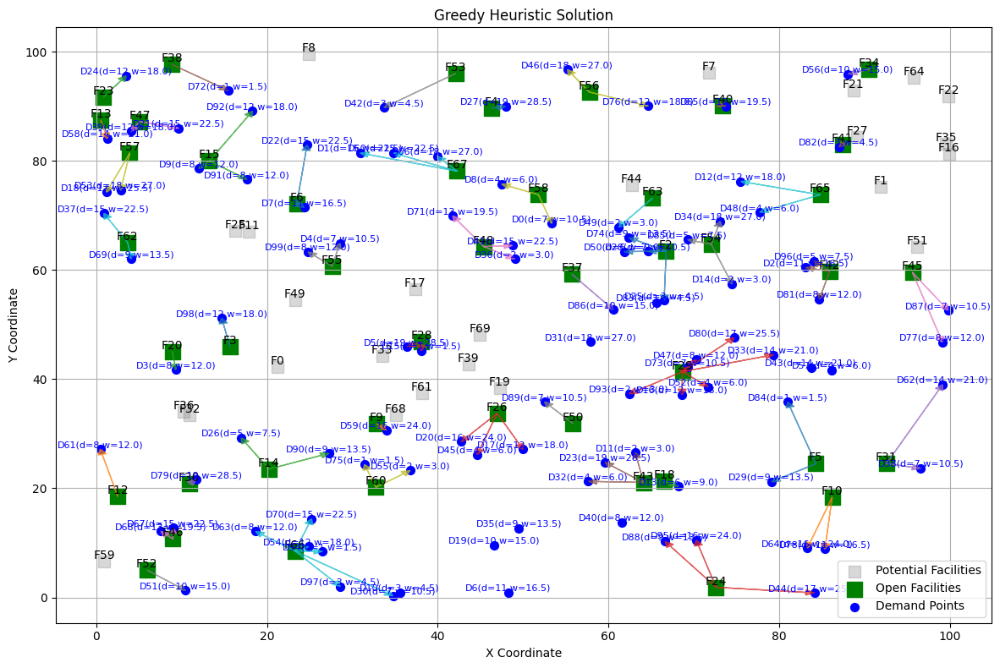



Running Three-Stage Heuristic...

Three-Stage Heuristic Results:
  Total weighted demand served: 1384.50
  Open facilities: [19, 68, 15, 47, 22, 36, 11, 38, 32, 13, 14, 60, 58, 65, 3, 12, 44, 30, 37, 9, 51, 66, 39, 16, 40, 7, 54, 17, 49, 6, 64, 55, 63, 53, 34, 62, 50, 61, 48, 20, 67, 52, 69, 8, 43, 35, 46, 41, 33, 42, 57, 26, 23, 21, 28, 27, 10, 25, 1, 24, 56, 45, 59, 29, 2]
  Execution time: 322.9917 seconds


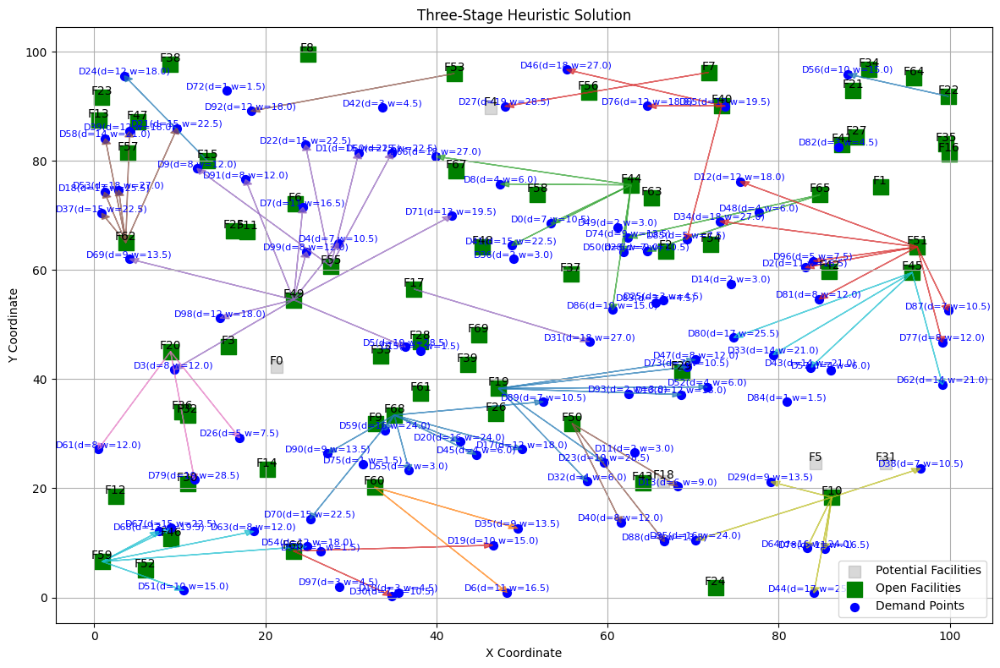

In [ ]:
import numpy as np
import heapq
from ortools.linear_solver import pywraplp
import random
from typing import List, Tuple, Dict, Set
import matplotlib.pyplot as plt
import time

class MCFLPD_Solver:
    """
    A solver class for the Maximum Coverage Capacitated Facility Location Problem
    with Range Constrained Drones (MCFLPD), now with visualization capabilities.
    """
    
    def __init__(self,
                 p: int,
                 K: int,
                 U: float,
                 B: float,
                 d: List[float],
                 b: List[List[float]],
                 w: List[float],
                 facility_locations: List[Tuple[float, float]] = None,
                 demand_locations: List[Tuple[float, float]] = None):
        """
        Initialize the MCFLPD solver with problem parameters and optional coordinates for visualization.
        """
        self.p = p
        self.K = K
        self.U = U
        self.B = B
        self.d = d
        self.b = b
        self.w = w
        self.num_demand_points = len(d)
        self.num_facility_locations = len(b[0]) if self.num_demand_points > 0 else 0
        
        # For visualization
        self.facility_locations = facility_locations if facility_locations else self._generate_default_locations(self.num_facility_locations)
        self.demand_locations = demand_locations if demand_locations else self._generate_default_locations(self.num_demand_points)
        
        # Validate coordinate data
        if len(self.facility_locations) != self.num_facility_locations:
            raise ValueError("Number of facility locations must match number of facility indices in b matrix")
        if len(self.demand_locations) != self.num_demand_points:
            raise ValueError("Number of demand locations must match length of demand list d")
    
    def _generate_default_locations(self, n: int) -> List[Tuple[float, float]]:
        """Generate random locations if none are provided."""
        return [(random.uniform(0, 100), random.uniform(0, 100)) for _ in range(n)]
    
    def visualize_solution(self, 
                         open_facilities: List[int], 
                         assignments: Dict[int, List[List[int]]],
                         title: str = "MCFLPD Solution Visualization") -> None:
        """
        Visualize the solution showing facilities, demand points, and drone routes.
        """
        plt.figure(figsize=(12, 8))
        
        # Plot all potential facility locations (gray)
        all_facility_x = [loc[0] for loc in self.facility_locations]
        all_facility_y = [loc[1] for loc in self.facility_locations]
        plt.scatter(all_facility_x, all_facility_y, c='gray', s=100, marker='s', label='Potential Facilities', alpha=0.3)
        
        # Plot open facilities (green)
        open_facility_x = [self.facility_locations[j][0] for j in open_facilities]
        open_facility_y = [self.facility_locations[j][1] for j in open_facilities]
        plt.scatter(open_facility_x, open_facility_y, c='green', s=150, marker='s', label='Open Facilities')
        
        # Plot demand points (blue)
        demand_x = [loc[0] for loc in self.demand_locations]
        demand_y = [loc[1] for loc in self.demand_locations]
        plt.scatter(demand_x, demand_y, c='blue', s=50, label='Demand Points')
        
        # Plot drone routes (colored arrows)
        colors = plt.cm.get_cmap('tab10', len(open_facilities))
        for idx, j in enumerate(open_facilities):
            facility_loc = self.facility_locations[j]
            for drone_path in assignments.get(j, []):
                for i in drone_path:
                    demand_loc = self.demand_locations[i]
                    plt.arrow(
                        facility_loc[0], facility_loc[1],
                        demand_loc[0] - facility_loc[0], demand_loc[1] - facility_loc[1],
                        head_width=1, head_length=1, fc=colors(idx), ec=colors(idx),
                        length_includes_head=True, alpha=0.7
                    )
        
        # Add labels and legend
        plt.title(title)
        plt.xlabel("X Coordinate")
        plt.ylabel("Y Coordinate")
        plt.legend()
        
        # Add facility and demand labels
        for j in range(self.num_facility_locations):
            plt.text(self.facility_locations[j][0], self.facility_locations[j][1], 
                    f'F{j}', ha='center', va='bottom', color='black')
        
        for i in range(self.num_demand_points):
            plt.text(self.demand_locations[i][0], self.demand_locations[i][1], 
                    f'D{i}(d={self.d[i]},w={self.w[i]})', ha='center', va='bottom', 
                    color='blue', fontsize=8)
        
        plt.grid(True)
        plt.tight_layout()
        plt.show()
        
    def greedy_heuristic(self) -> Tuple[float, List[int], Dict[int, List[List[int]]], float]:
        """
        Implements a greedy heuristic for the MCFLPD.
        Returns:
            Tuple containing:
            - total_demand_served
            - open_facilities
            - assignments
            - execution_time in seconds
        """
        start_time = time.time()
        
        # Original greedy heuristic implementation
        weight_matrix = []
        for i in range(self.num_demand_points):
            for j in range(self.num_facility_locations):
                if self.b[i][j] <= self.B:
                    weight_ratio = self.w[i] / self.b[i][j] if self.b[i][j] > 0 else float('inf')
                    weight_matrix.append((-weight_ratio, i, j))

        heapq.heapify(weight_matrix)

        open_facilities_set = set()
        facility_current_demand = {}
        demand_to_facility_assignment = {}
        facility_remaining_capacity = {}

        while weight_matrix and len(demand_to_facility_assignment) < self.num_demand_points:
            neg_weight_ratio, i, j = heapq.heappop(weight_matrix)
            weight_ratio = -neg_weight_ratio

            if i in demand_to_facility_assignment or weight_ratio <= 0:
                continue

            if j in open_facilities_set:
                if facility_remaining_capacity[j] >= self.d[i]:
                    demand_to_facility_assignment[i] = j
                    facility_current_demand[j] += self.d[i]
                    facility_remaining_capacity[j] -= self.d[i]
            else:
                if len(open_facilities_set) < self.p and self.d[i] <= self.U:
                    open_facilities_set.add(j)
                    demand_to_facility_assignment[i] = j
                    facility_current_demand[j] = self.d[i]
                    facility_remaining_capacity[j] = self.U - self.d[i]
                else:
                    best_j_for_i = None
                    min_battery_consumption = float('inf')
                    for open_j in open_facilities_set:
                        if (self.b[i][open_j] <= self.B and
                                facility_remaining_capacity[open_j] >= self.d[i] and
                                self.b[i][open_j] < min_battery_consumption):
                            best_j_for_i = open_j
                            min_battery_consumption = self.b[i][open_j]

                    if best_j_for_i is not None:
                        demand_to_facility_assignment[i] = best_j_for_i
                        facility_current_demand[best_j_for_i] += self.d[i]
                        facility_remaining_capacity[best_j_for_i] -= self.d[i]

        open_facilities = list(open_facilities_set)

        # Drone allocation
        drones_estimated_needed = {j: 0 for j in open_facilities}
        for j in open_facilities:
            total_battery_for_facility = sum(self.b[i][j] for i, assigned_j in demand_to_facility_assignment.items() if assigned_j == j)
            drones_estimated_needed[j] = int(np.ceil(total_battery_for_facility / self.B))

        drone_actual_allocation = {j: 0 for j in open_facilities}
        remaining_total_drones = self.K

        drone_priority_queue = []
        for j in open_facilities:
            if drones_estimated_needed[j] > 0:
                heapq.heappush(drone_priority_queue, (-drones_estimated_needed[j], j))

        while remaining_total_drones > 0 and drone_priority_queue:
            neg_estimated_drones, j = heapq.heappop(drone_priority_queue)
            estimated_drones = -neg_estimated_drones

            if drone_actual_allocation[j] < estimated_drones:
                drone_actual_allocation[j] += 1
                remaining_total_drones -= 1

                if drone_actual_allocation[j] < estimated_drones:
                    heapq.heappush(drone_priority_queue, (-(estimated_drones - drone_actual_allocation[j]), j))

        assignments = {j: [[] for _ in range(drone_actual_allocation[j])] for j in open_facilities}
        unserved_demands_due_to_drone_capacity = set()

        for j in open_facilities:
            facility_assigned_demands = [i for i, assigned_j in demand_to_facility_assignment.items() if assigned_j == j]
            facility_assigned_demands.sort(key=lambda i: self.b[i][j])

            drone_idx_counter = 0
            for i in facility_assigned_demands:
                assigned_to_drone = False
                for _ in range(drone_actual_allocation[j]):
                    current_drone_idx = drone_idx_counter % drone_actual_allocation[j] if drone_actual_allocation[j] > 0 else -1

                    if current_drone_idx == -1:
                        break

                    current_load_on_drone = sum(self.b[di][j] for di in assignments[j][current_drone_idx])

                    if current_load_on_drone + self.b[i][j] <= self.B:
                        assignments[j][current_drone_idx].append(i)
                        assigned_to_drone = True
                        break
                    
                    drone_idx_counter += 1

                if not assigned_to_drone:
                    unserved_demands_due_to_drone_capacity.add(i)

        total_demand_served = 0.0
        for j_assignments in assignments.values():
            for drone_path in j_assignments:
                for i in drone_path:
                    total_demand_served += self.w[i]

        execution_time = time.time() - start_time
        return total_demand_served, open_facilities, assignments, execution_time

    def three_stage_heuristic(self, r: int = 1, max_iter: int = 100) -> Tuple[float, List[int], Dict[int, List[List[int]]], float]:
        """
        Implements the Three-Stage Heuristic (3SH) for MCFLPD.
        Returns:
            Tuple containing:
            - best_demand_served
            - best_open_facilities
            - best_solution_assignments
            - execution_time in seconds
        """
        start_time = time.time()
        
        best_solution_assignments = None
        best_demand_served = -1.0
        best_open_facilities = []

        if self.num_facility_locations < self.p:
            initial_open_facilities = list(range(self.num_facility_locations))
        else:
            initial_open_facilities = random.sample(range(self.num_facility_locations), self.p)

        current_open_facilities = initial_open_facilities.copy()

        for iteration in range(max_iter):
            demand_to_facility_assignment, current_total_demand_from_allocation = \
                self._solve_allocation_problem(current_open_facilities)

            current_assignments, current_demand_served_by_drones = \
                self._drone_assignment_knapsack(current_open_facilities, demand_to_facility_assignment)

            if current_demand_served_by_drones > best_demand_served:
                best_demand_served = current_demand_served_by_drones
                best_solution_assignments = current_assignments
                best_open_facilities = current_open_facilities.copy()

            if not current_open_facilities or len(current_open_facilities) < r:
                break

            facility_demand_contribution = {j: 0.0 for j in current_open_facilities}
            for i, assigned_j in demand_to_facility_assignment.items():
                if assigned_j in facility_demand_contribution:
                    facility_demand_contribution[assigned_j] += self.w[i]

            sorted_facilities_by_contribution = sorted(current_open_facilities,
                                                       key=lambda j: facility_demand_contribution.get(j, 0.0))
            facilities_to_remove = sorted_facilities_by_contribution[:r]

            remaining_potential_locations = [j for j in range(self.num_facility_locations)
                                             if j not in current_open_facilities]

            if len(remaining_potential_locations) < r:
                break

            new_facilities_to_add = random.sample(remaining_potential_locations, r)

            current_open_facilities = [j for j in current_open_facilities if j not in facilities_to_remove] + new_facilities_to_add

        execution_time = time.time() - start_time
        return best_demand_served, best_open_facilities, best_solution_assignments, execution_time

    def _solve_allocation_problem(self, open_facilities: List[int]) -> Tuple[Dict[int, int], float]:
        """Original implementation unchanged"""
        solver = pywraplp.Solver.CreateSolver('SCIP')
        if not solver:
            print("Error: SCIP solver not available.")
            return {}, 0.0

        x = {}
        for i in range(self.num_demand_points):
            for j in open_facilities:
                if self.b[i][j] <= self.B:
                    x[i, j] = solver.IntVar(0, 1, f'x_{i}_{j}')

        objective = solver.Objective()
        for (i, j), var in x.items():
            objective.SetCoefficient(var, self.w[i])
        objective.SetMaximization()

        for i in range(self.num_demand_points):
            constraint = solver.Constraint(0, 1, f'demand_assignment_limit_{i}')
            for j in open_facilities:
                if (i, j) in x:
                    constraint.SetCoefficient(x[i, j], 1)

        for j in open_facilities:
            constraint = solver.Constraint(0, self.U, f'facility_capacity_{j}')
            for i in range(self.num_demand_points):
                if (i, j) in x:
                    constraint.SetCoefficient(x[i, j], self.d[i])

        status = solver.Solve()

        demand_assignment = {}
        total_weighted_demand_served = 0.0

        if status == pywraplp.Solver.OPTIMAL or status == pywraplp.Solver.FEASIBLE:
            for i in range(self.num_demand_points):
                for j in open_facilities:
                    if (i, j) in x and x[i, j].solution_value() > 0.5:
                        demand_assignment[i] = j
                        total_weighted_demand_served += self.w[i]
                        break
        else:
            print(f"Warning: Allocation problem did not find an optimal or feasible solution. Status: {status}")

        return demand_assignment, total_weighted_demand_served

    def _drone_assignment_knapsack(self,
                                   open_facilities: List[int],
                                   demand_to_facility_assignment: Dict[int, int]) \
                                   -> Tuple[Dict[int, List[List[int]]], float]:
        """Original implementation unchanged"""
        assignments = {j: [] for j in open_facilities}
        total_weighted_demand_served = 0.0
        remaining_total_drones = self.K

        facility_demands_for_knapsack = {j: [] for j in open_facilities}
        for i, j in demand_to_facility_assignment.items():
            facility_demands_for_knapsack[j].append((i, self.b[i][j], self.w[i]))

        while remaining_total_drones > 0:
            knapsack_results_for_iteration = []

            for j in open_facilities:
                if not facility_demands_for_knapsack[j]:
                    continue

                selected_items_for_drone, value_from_drone = \
                    self._solve_knapsack(facility_demands_for_knapsack[j])

                if value_from_drone > 0:
                    knapsack_results_for_iteration.append((value_from_drone, j, selected_items_for_drone))

            if not knapsack_results_for_iteration:
                break

            knapsack_results_for_iteration.sort(key=lambda x: x[0], reverse=True)
            best_value_this_drone, best_j_for_drone, best_selected_items_for_drone = \
                knapsack_results_for_iteration[0]

            assignments[best_j_for_drone].append([i for i, _, _ in best_selected_items_for_drone])
            total_weighted_demand_served += best_value_this_drone
            remaining_total_drones -= 1

            selected_demand_ids = set(i for i, _, _ in best_selected_items_for_drone)
            facility_demands_for_knapsack[best_j_for_drone] = [
                item for item in facility_demands_for_knapsack[best_j_for_drone]
                if item[0] not in selected_demand_ids
            ]

        return assignments, total_weighted_demand_served

    def _solve_knapsack(self, items: List[Tuple[int, float, float]]) -> Tuple[List[Tuple[int, float, float]], float]:
        """Original implementation unchanged"""
        solver = pywraplp.Solver.CreateSolver('SCIP')
        if not solver:
            print("Error: SCIP solver not available for knapsack.")
            return [], 0.0

        x = {}
        for idx, (i, bij, di) in enumerate(items):
            x[idx] = solver.IntVar(0, 1, f'x_item_{i}')

        knapsack_capacity_constraint = solver.Constraint(0, self.B, 'drone_battery_capacity')
        for idx, (i, bij, di) in enumerate(items):
            knapsack_capacity_constraint.SetCoefficient(x[idx], bij)

        objective = solver.Objective()
        for idx, (i, bij, di) in enumerate(items):
            objective.SetCoefficient(x[idx], di)
        objective.SetMaximization()

        status = solver.Solve()

        selected_items = []
        total_profit = 0.0

        if status == pywraplp.Solver.OPTIMAL or status == pywraplp.Solver.FEASIBLE:
            for idx, item in enumerate(items):
                if x[idx].solution_value() > 0.5:
                    selected_items.append(item)
                    total_profit += item[2]
        else:
            print(f"Warning: Knapsack problem did not find an optimal or feasible solution. Status: {status}")

        return selected_items, total_profit

if __name__ == "__main__":
    # Example problem parameters
    p = 65  # Maximum number of facilities to open
    K = 70  # Total number of drones available
    U = 100.0  # Facility capacity
    B = 50.0  # Drone battery capacity

    # Example data (small problem)
    num_demand_points = 100
    num_facility_locations = 70

    # Random data generation for demonstration
    np.random.seed(42)  # For reproducibility
    
    # Generate coordinates for visualization
    facility_locations = [(random.uniform(0, 100), random.uniform(0, 100)) for _ in range(num_facility_locations)]
    demand_locations = [(random.uniform(0, 100), random.uniform(0, 100)) for _ in range(num_demand_points)]
    
    # Calculate distances (for battery consumption)
    def euclidean_distance(a, b):
        return np.sqrt((a[0]-b[0])**2 + (a[1]-b[1])**2)
    
    # Battery consumption proportional to distance
    b = []
    for i in range(num_demand_points):
        b_row = []
        for j in range(num_facility_locations):
            distance = euclidean_distance(demand_locations[i], facility_locations[j])
            b_row.append(distance * 2)  # Multiply by 2 for round trip
        b.append(b_row)
    
    d = np.random.randint(1, 20, size=num_demand_points).tolist()  # Demands
    w = [float(val) * 1.5 for val in d]  # Weights (1.5x demand for variation)

    # Create solver instance with locations
    solver = MCFLPD_Solver(p, K, U, B, d, b, w, facility_locations, demand_locations)

    print("Running Greedy Heuristic...")
    greedy_demand, greedy_facilities, greedy_assignments, greedy_time = solver.greedy_heuristic()
    print(f"\nGreedy Heuristic Results:")
    print(f"  Total weighted demand served: {greedy_demand:.2f}")
    print(f"  Open facilities: {greedy_facilities}")
    print(f"  Execution time: {greedy_time:.4f} seconds")
    
    solver.visualize_solution(greedy_facilities, greedy_assignments, "Greedy Heuristic Solution")

    print("\n" + "="*50 + "\n")

    print("Running Three-Stage Heuristic...")
    tsh_demand, tsh_facilities, tsh_assignments, tsh_time = solver.three_stage_heuristic(r=1, max_iter=50)
    print(f"\nThree-Stage Heuristic Results:")
    print(f"  Total weighted demand served: {tsh_demand:.2f}")
    print(f"  Open facilities: {tsh_facilities}")
    print(f"  Execution time: {tsh_time:.4f} seconds")
    
    solver.visualize_solution(tsh_facilities, tsh_assignments, "Three-Stage Heuristic Solution")

Running Greedy Heuristic...

Greedy Heuristic Results:
  Total weighted demand served: 6952.50
  Open facilities: 100/100
  Execution time: 0.2962 seconds


C:\Users\Prateek\AppData\Local\Temp\ipykernel_12704\905576904.py:129: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab20', len(open_facilities))


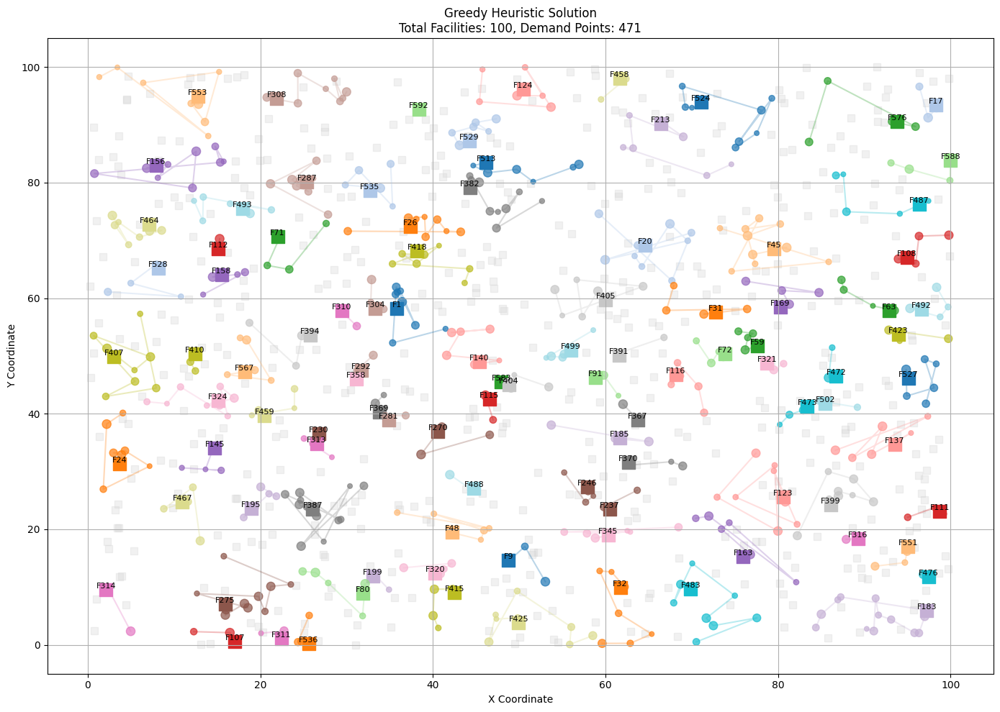

C:\Users\Prateek\AppData\Local\Temp\ipykernel_12704\905576904.py:80: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10', len(assignments.get(j, [])))
C:\Users\Prateek\AppData\Local\Temp\ipykernel_12704\905576904.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10, 8))


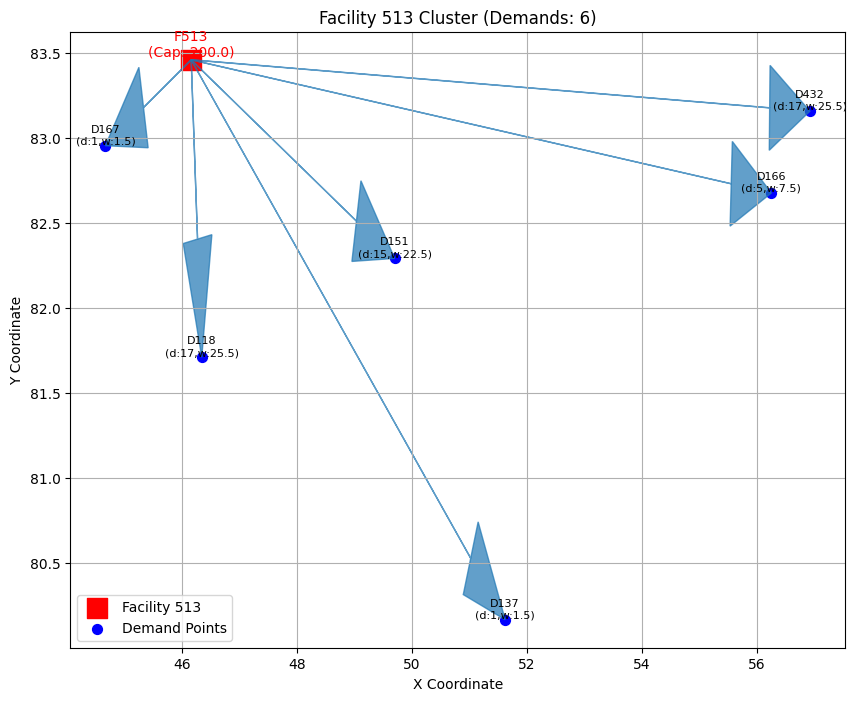

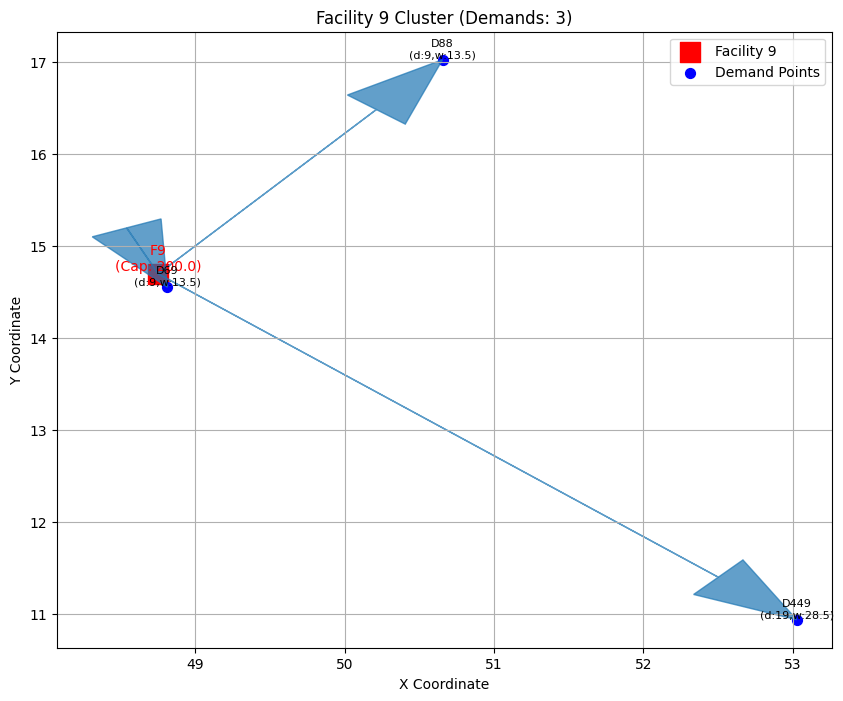

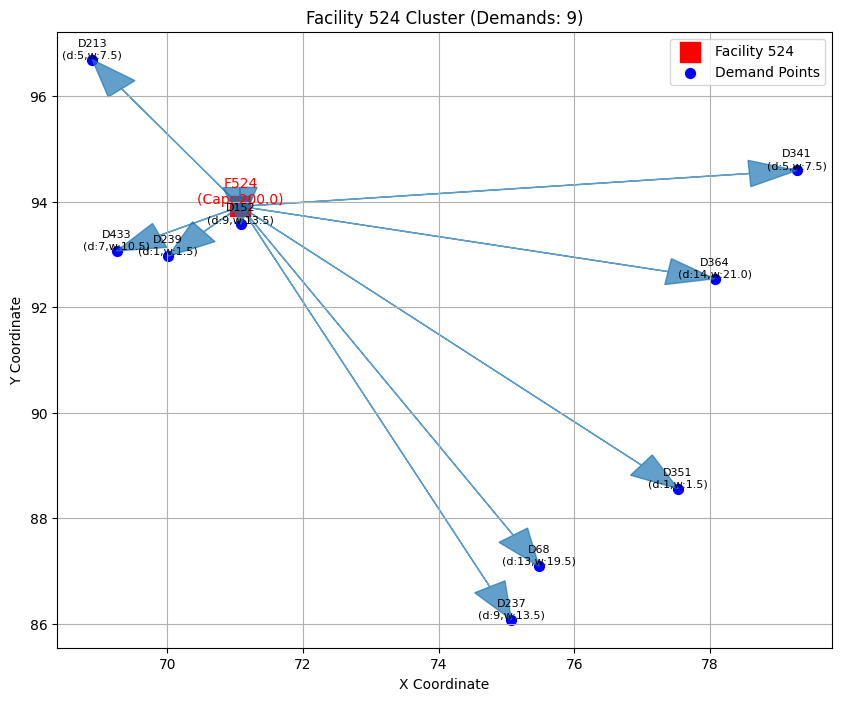

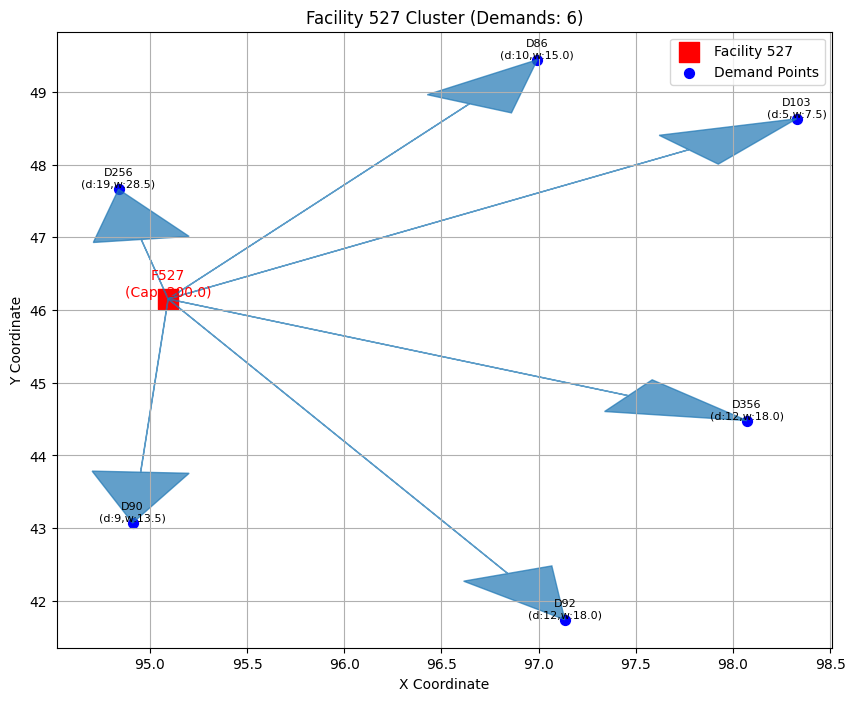

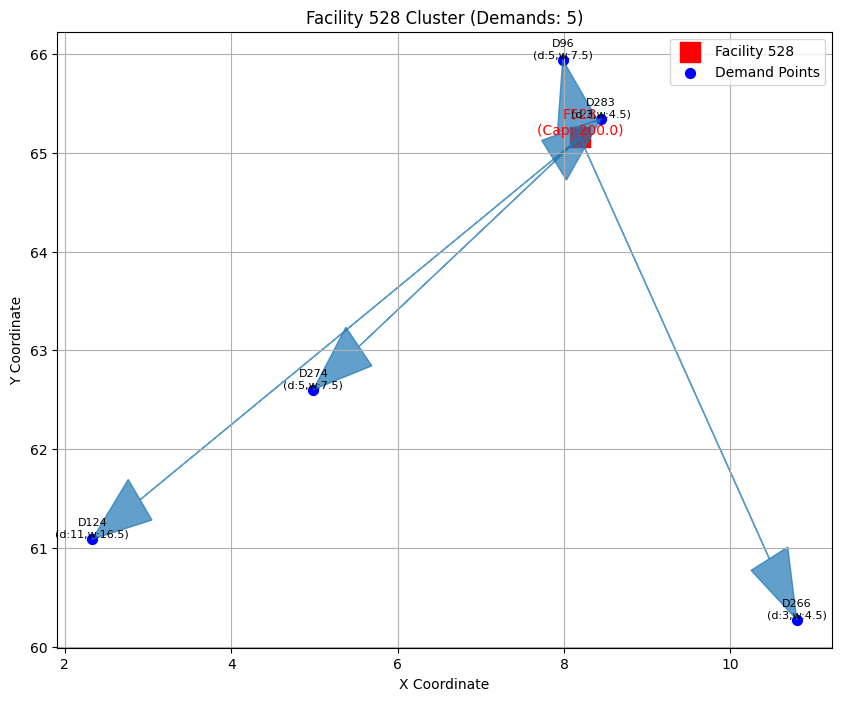

...

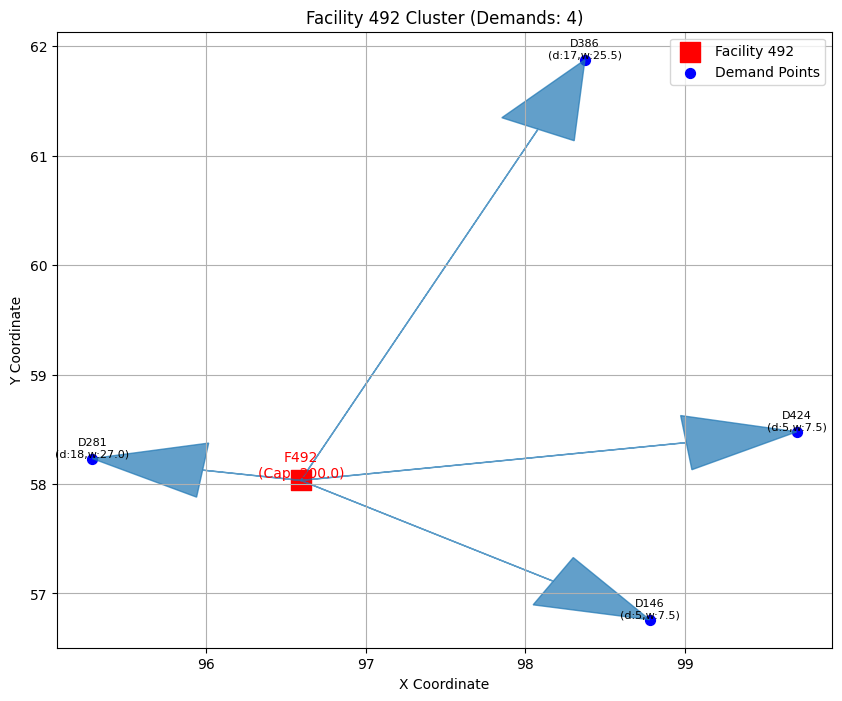

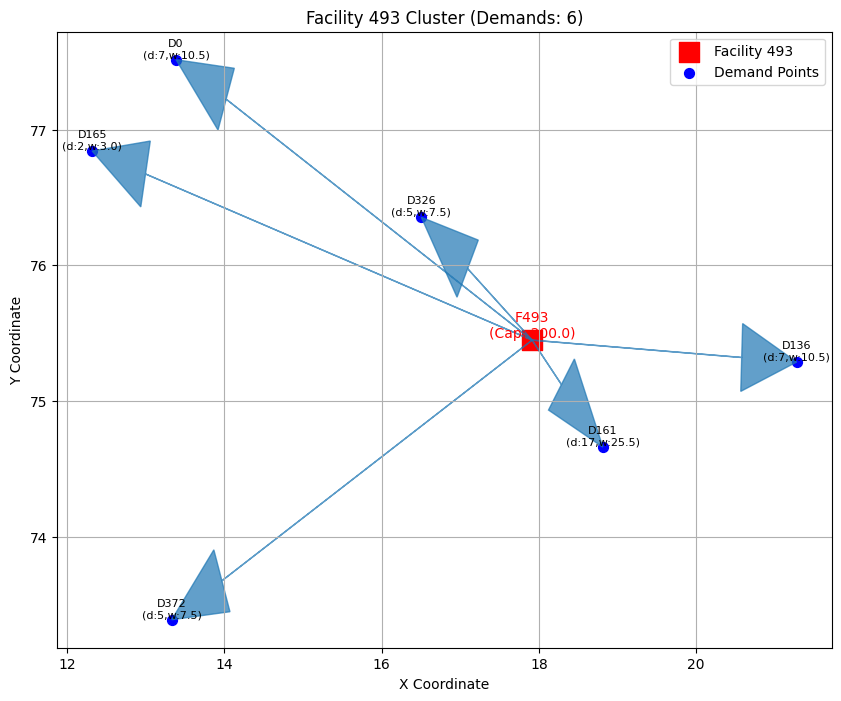

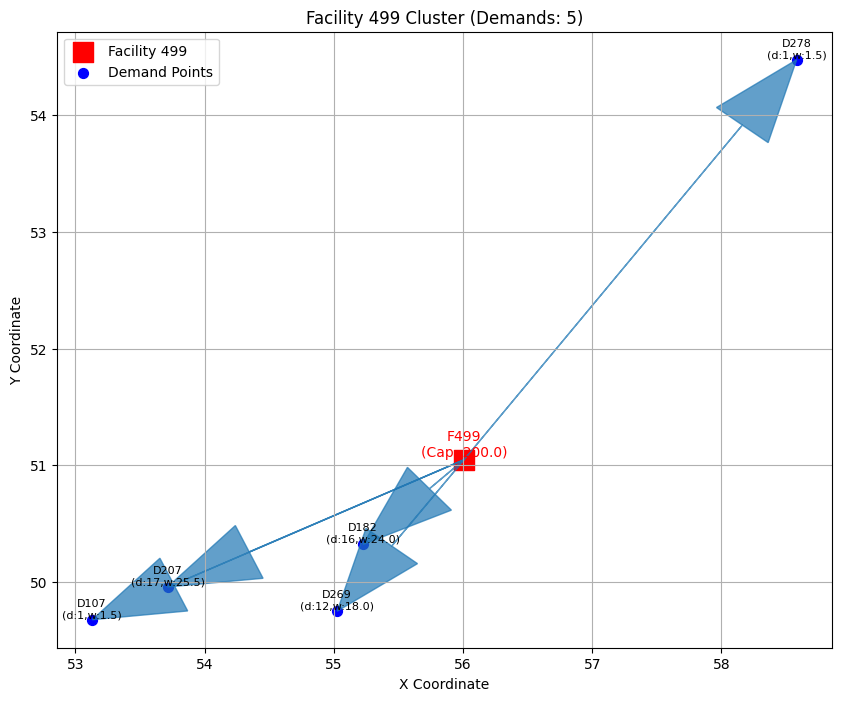

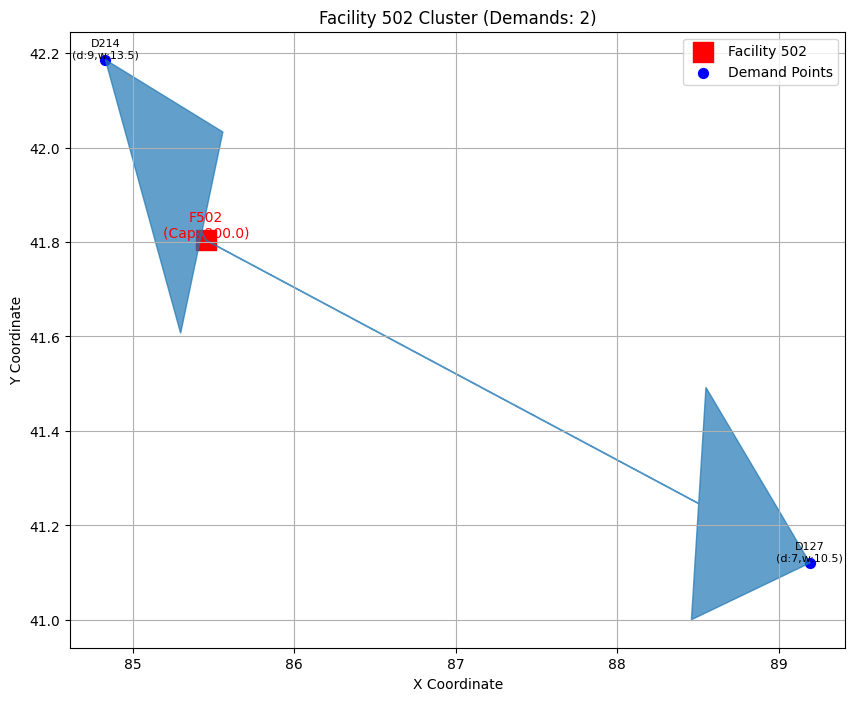

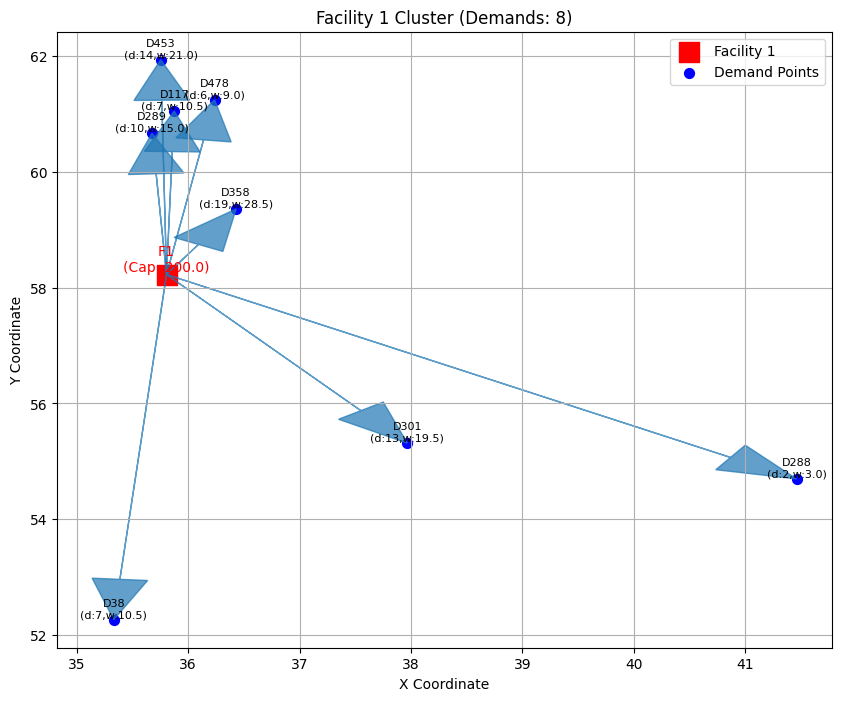

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>



Running Three-Stage Heuristic...

Three-Stage Heuristic Results:
  Total weighted demand served: 4188.00
  Open facilities: 100/100
  Execution time: 1664.5470 seconds


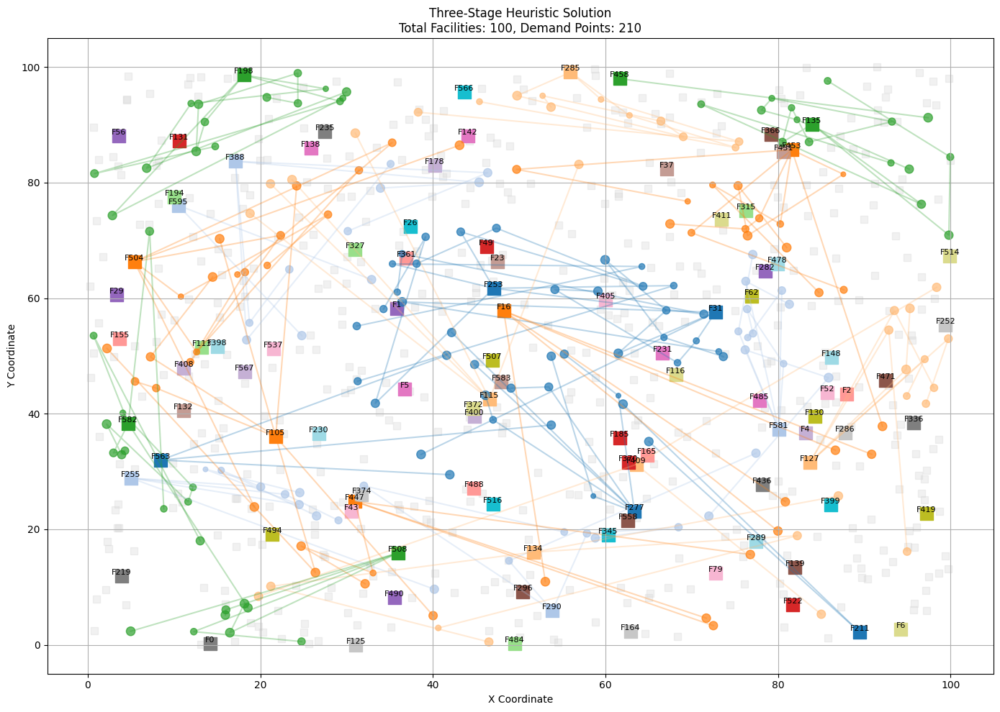

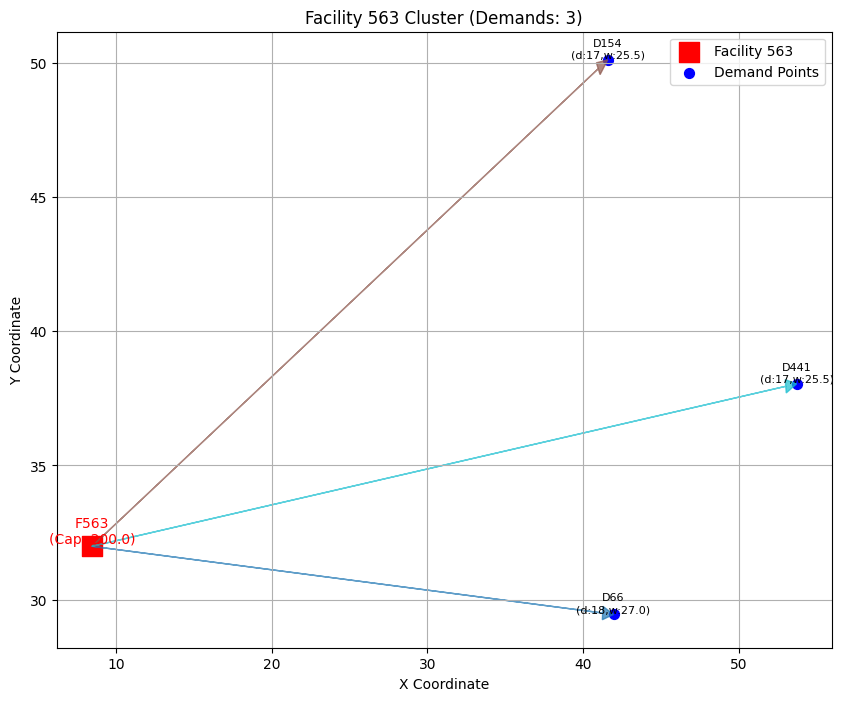

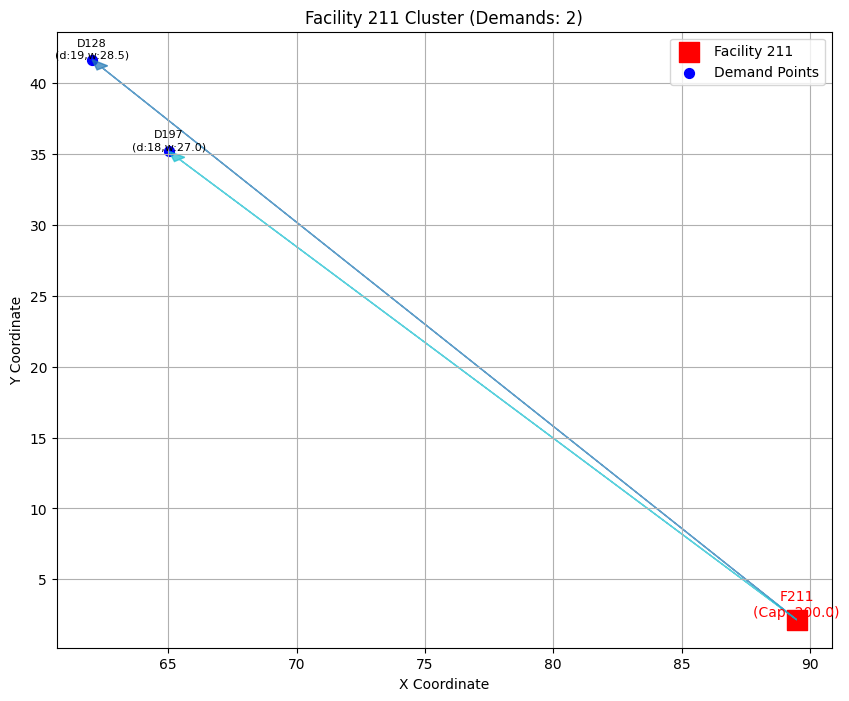

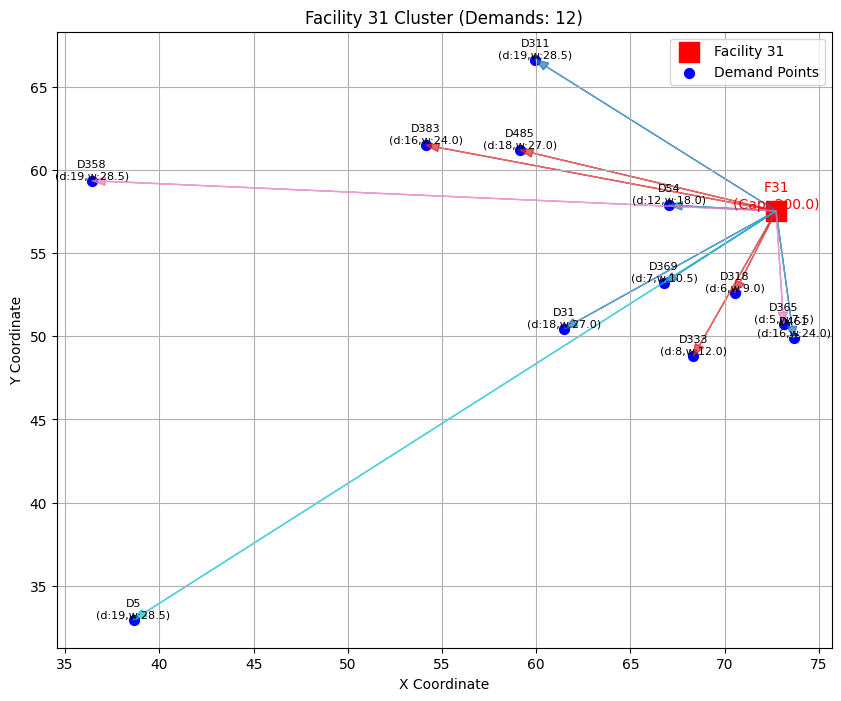

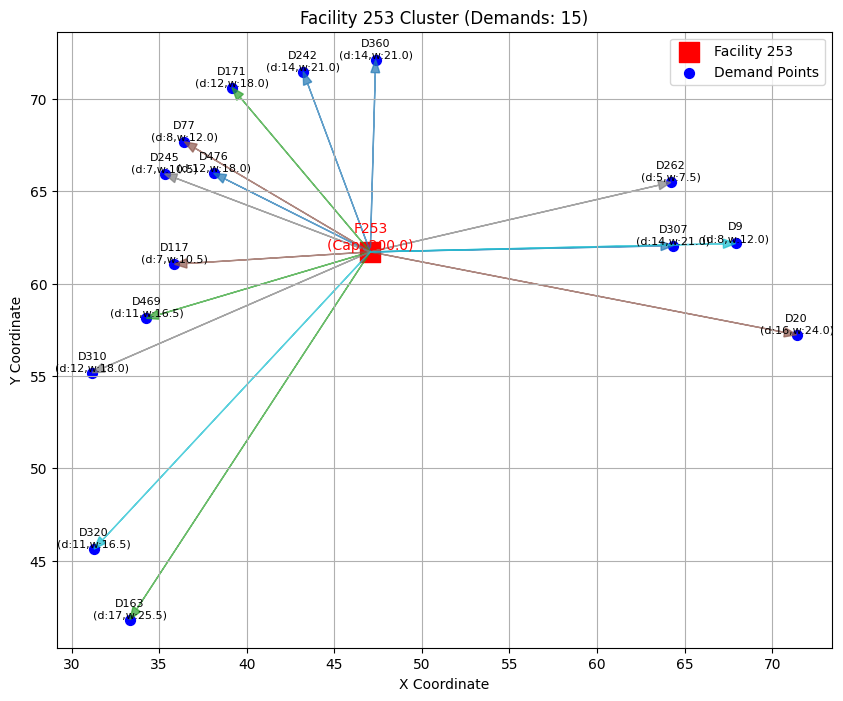

...

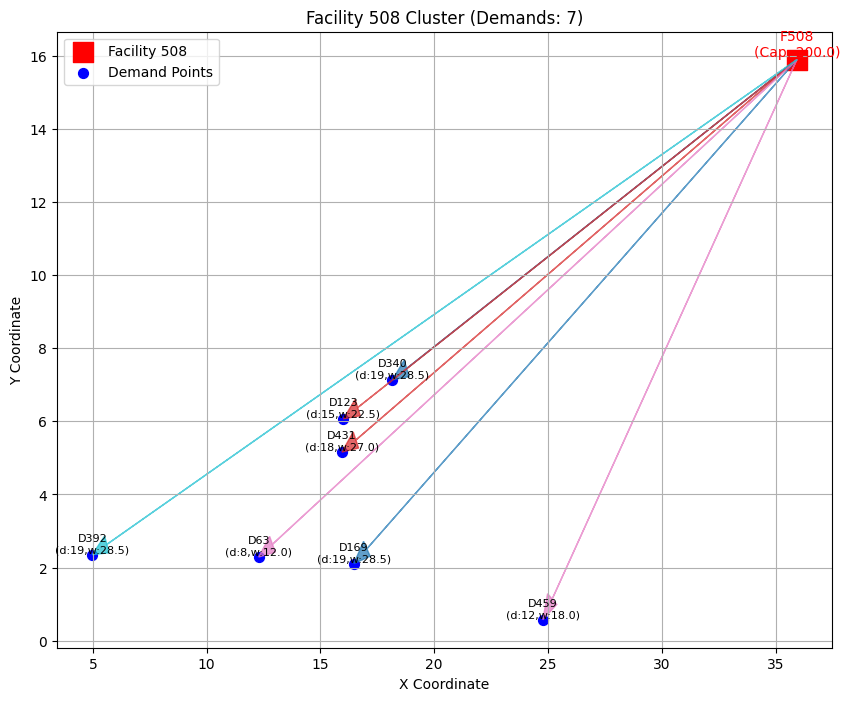

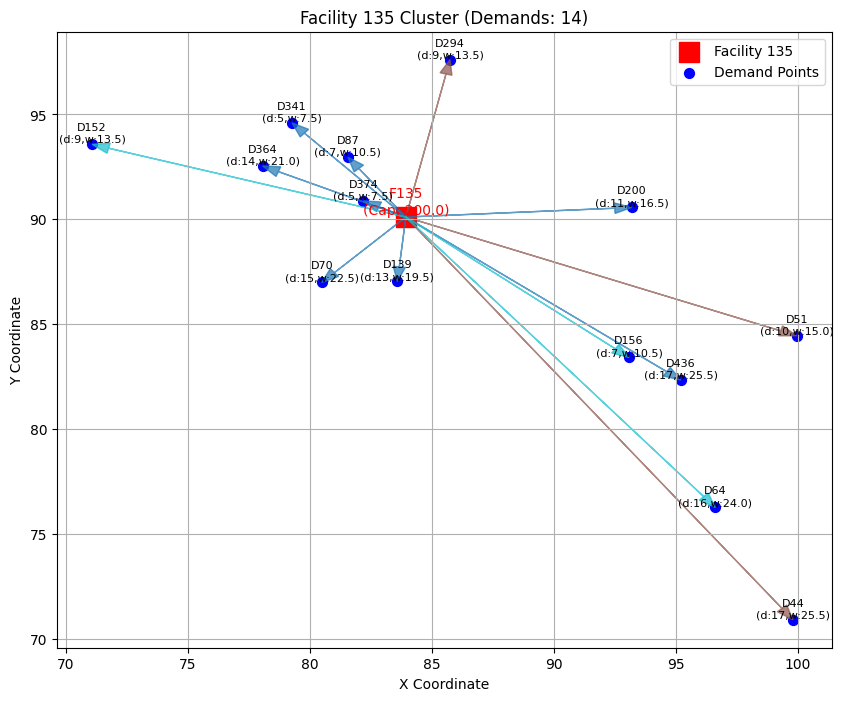

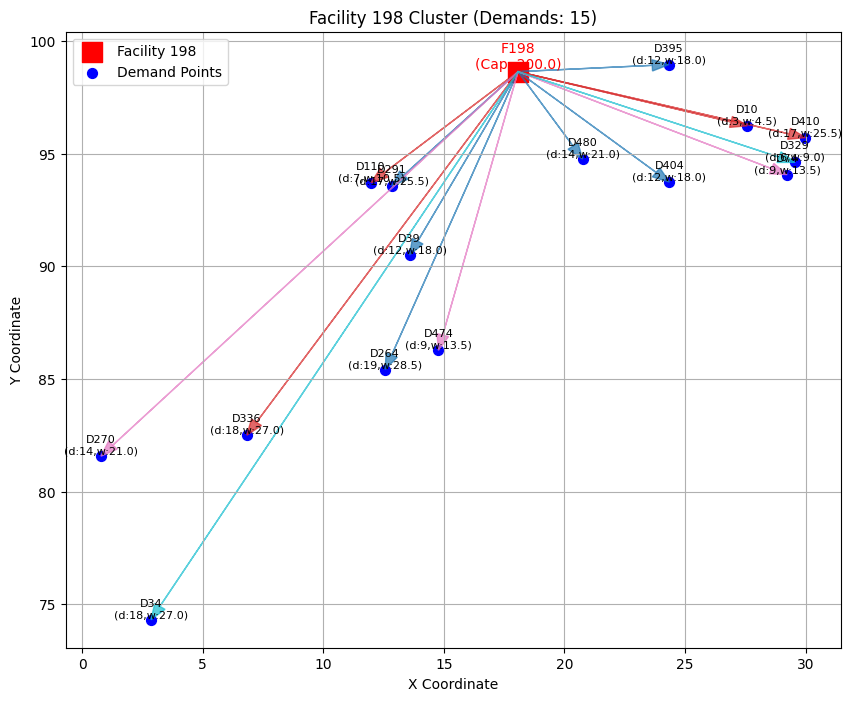

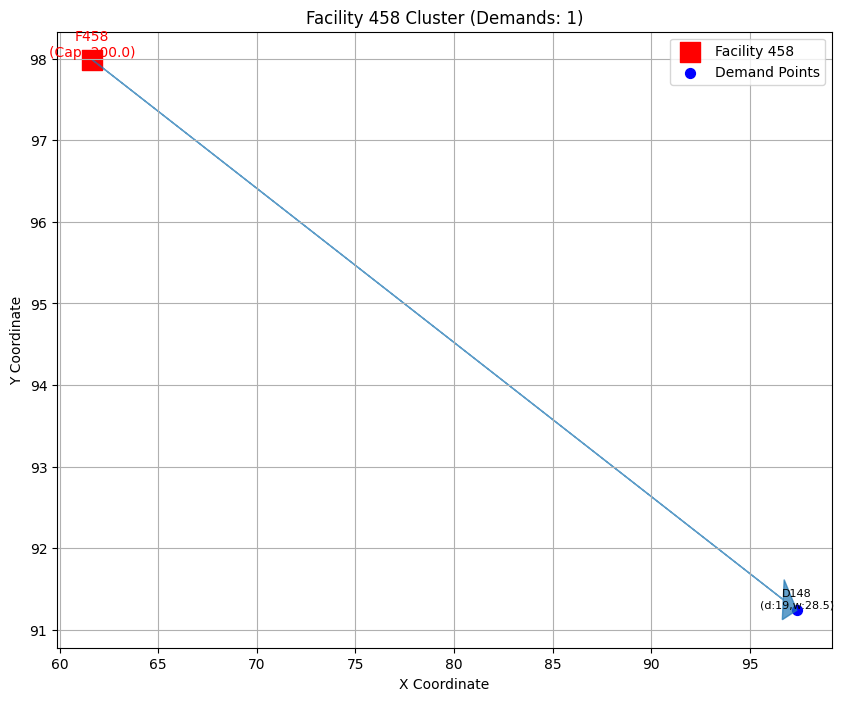

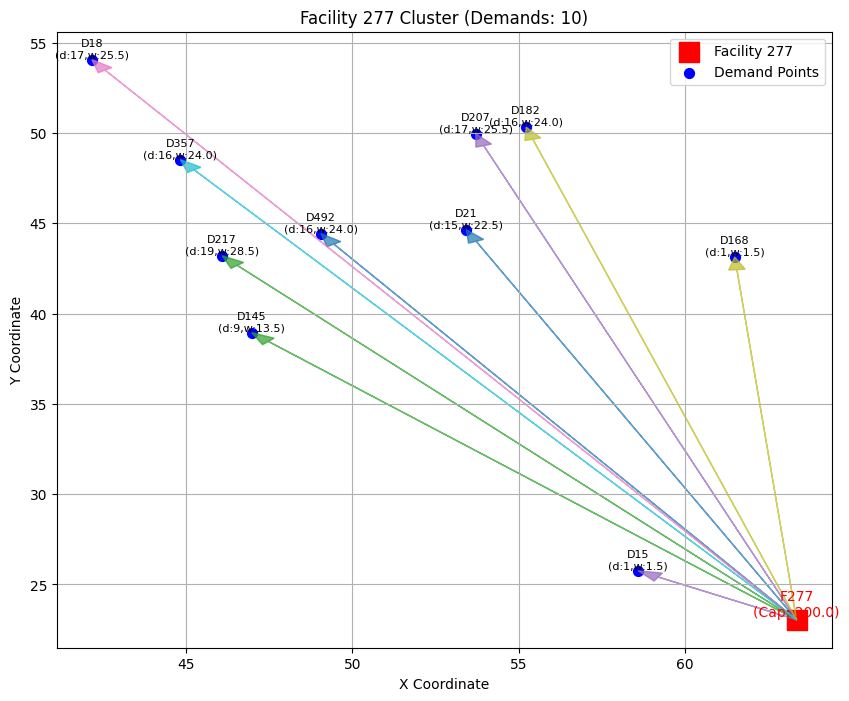

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [ ]:
import numpy as np
import heapq
from ortools.linear_solver import pywraplp
import random
from typing import List, Tuple, Dict, Set
import matplotlib.pyplot as plt
import time
from sklearn.cluster import KMeans

class MCFLPD_Solver:
    """
    An enhanced solver class for MCFLPD with improved visualization capabilities
    that handles large datasets better and provides cluster diagrams.
    """
    
    def __init__(self,
                 p: int,
                 K: int,
                 U: float,
                 B: float,
                 d: List[float],
                 b: List[List[float]],
                 w: List[float],
                 facility_locations: List[Tuple[float, float]] = None,
                 demand_locations: List[Tuple[float, float]] = None):
        """Initialize with enhanced visualization parameters"""
        self.p = p
        self.K = K
        self.U = U
        self.B = B
        self.d = d
        self.b = b
        self.w = w
        self.num_demand_points = len(d)
        self.num_facility_locations = len(b[0]) if self.num_demand_points > 0 else 0
        
        # For visualization
        self.facility_locations = facility_locations if facility_locations else self._generate_default_locations(self.num_facility_locations)
        self.demand_locations = demand_locations if demand_locations else self._generate_default_locations(self.num_demand_points)
        
        # Validate coordinate data
        if len(self.facility_locations) != self.num_facility_locations:
            raise ValueError("Number of facility locations must match number of facility indices in b matrix")
        if len(self.demand_locations) != self.num_demand_points:
            raise ValueError("Number of demand locations must match length of demand list d")
    
    def _generate_default_locations(self, n: int) -> List[Tuple[float, float]]:
        """Generate random locations if none are provided."""
        return [(random.uniform(0, 100), random.uniform(0, 100)) for _ in range(n)]
    
    def _create_cluster_diagram(self, open_facilities: List[int], assignments: Dict[int, List[List[int]]]):
        """
        Create cluster diagrams showing facilities and their assigned demand points.
        Returns a dictionary of figures for each cluster.
        """
        # Create facility-demand clusters
        clusters = {}
        for j in open_facilities:
            demand_indices = []
            for drone_path in assignments.get(j, []):
                demand_indices.extend(drone_path)
            if demand_indices:
                clusters[j] = demand_indices
        
        # Create a figure for each cluster
        cluster_figures = {}
        for j, demand_indices in clusters.items():
            fig, ax = plt.subplots(figsize=(10, 8))
            
            # Plot the facility
            fac_x, fac_y = self.facility_locations[j]
            ax.scatter(fac_x, fac_y, c='red', s=200, marker='s', label=f'Facility {j}')
            
            # Plot demand points
            demand_x = [self.demand_locations[i][0] for i in demand_indices]
            demand_y = [self.demand_locations[i][1] for i in demand_indices]
            ax.scatter(demand_x, demand_y, c='blue', s=50, label='Demand Points')
            
            # Plot drone routes
            colors = plt.cm.get_cmap('tab10', len(assignments.get(j, [])))
            for drone_idx, drone_path in enumerate(assignments.get(j, [])):
                for i in drone_path:
                    dx, dy = self.demand_locations[i]
                    ax.arrow(
                        fac_x, fac_y,
                        dx - fac_x, dy - fac_y,
                        head_width=0.5, head_length=0.7, 
                        fc=colors(drone_idx), ec=colors(drone_idx),
                        length_includes_head=True, alpha=0.7
                    )
            
            # Set title and labels
            ax.set_title(f'Facility {j} Cluster (Demands: {len(demand_indices)})')
            ax.set_xlabel("X Coordinate")
            ax.set_ylabel("Y Coordinate")
            ax.legend()
            ax.grid(True)
            
            # Add data labels for important points
            ax.text(fac_x, fac_y, f'F{j}\n(Cap: {self.U})', 
                    ha='center', va='bottom', color='red')
            
            for i in demand_indices:
                dx, dy = self.demand_locations[i]
                ax.text(dx, dy, f'D{i}\n(d:{self.d[i]},w:{self.w[i]:.1f})', 
                       ha='center', va='bottom', fontsize=8)
            
            cluster_figures[j] = fig
        
        return cluster_figures
    
    def visualize_solution(self, 
                         open_facilities: List[int], 
                         assignments: Dict[int, List[List[int]]],
                         title: str = "MCFLPD Solution Visualization",
                         show_clusters: bool = True) -> None:
        """
        Enhanced visualization that handles large datasets better and provides cluster options.
        """
        # Create main overview figure
        plt.figure(figsize=(14, 10))
        
        # Plot all potential facilities (light gray)
        all_fac_x = [loc[0] for loc in self.facility_locations]
        all_fac_y = [loc[1] for loc in self.facility_locations]
        plt.scatter(all_fac_x, all_fac_y, c='lightgray', s=50, marker='s', alpha=0.3)
        
        # Plot open facilities (colored by cluster)
        colors = plt.cm.get_cmap('tab20', len(open_facilities))
        for idx, j in enumerate(open_facilities):
            fac_x, fac_y = self.facility_locations[j]
            plt.scatter(fac_x, fac_y, c=[colors(idx)], s=150, marker='s')
        
        # Plot demand points (colored by assigned facility)
        demand_colors = []
        demand_sizes = []
        demand_coords = []
        facility_color_map = {j: colors(idx) for idx, j in enumerate(open_facilities)}
        
        for j in open_facilities:
            for drone_path in assignments.get(j, []):
                for i in drone_path:
                    demand_coords.append(self.demand_locations[i])
                    demand_colors.append(facility_color_map[j])
                    demand_sizes.append(20 + self.w[i]*2)  # Size by weight
        
        if demand_coords:
            demand_x, demand_y = zip(*demand_coords)
            plt.scatter(demand_x, demand_y, c=demand_colors, s=demand_sizes, alpha=0.7)
        
        # Add simplified connections (just for visualization)
        for j in open_facilities:
            fac_x, fac_y = self.facility_locations[j]
            for drone_path in assignments.get(j, []):
                path_x = [fac_x] + [self.demand_locations[i][0] for i in drone_path]
                path_y = [fac_y] + [self.demand_locations[i][1] for i in drone_path]
                plt.plot(path_x, path_y, '-', color=facility_color_map[j], alpha=0.3)
        
        # Add labels only for important points
        for j in open_facilities:
            fac_x, fac_y = self.facility_locations[j]
            plt.text(fac_x, fac_y, f'F{j}', ha='center', va='bottom', fontsize=8)
        
        plt.title(f"{title}\nTotal Facilities: {len(open_facilities)}, Demand Points: {len(demand_coords)}")
        plt.xlabel("X Coordinate")
        plt.ylabel("Y Coordinate")
        plt.grid(True)
        plt.tight_layout()
        plt.show()
        
        # Create cluster diagrams if requested
        if show_clusters and open_facilities:
            cluster_figs = self._create_cluster_diagram(open_facilities, assignments)
            for j, fig in cluster_figs.items():
                plt.figure(fig.number)  # Make the cluster figure active
                plt.show()

    def greedy_heuristic(self) -> Tuple[float, List[int], Dict[int, List[List[int]]], float]:
        """
        Implements a greedy heuristic for the MCFLPD.
        Returns:
            Tuple containing:
            - total_demand_served
            - open_facilities
            - assignments
            - execution_time in seconds
        """
        start_time = time.time()
        
        # Original greedy heuristic implementation
        weight_matrix = []
        for i in range(self.num_demand_points):
            for j in range(self.num_facility_locations):
                if self.b[i][j] <= self.B:
                    weight_ratio = self.w[i] / self.b[i][j] if self.b[i][j] > 0 else float('inf')
                    weight_matrix.append((-weight_ratio, i, j))

        heapq.heapify(weight_matrix)

        open_facilities_set = set()
        facility_current_demand = {}
        demand_to_facility_assignment = {}
        facility_remaining_capacity = {}

        while weight_matrix and len(demand_to_facility_assignment) < self.num_demand_points:
            neg_weight_ratio, i, j = heapq.heappop(weight_matrix)
            weight_ratio = -neg_weight_ratio

            if i in demand_to_facility_assignment or weight_ratio <= 0:
                continue

            if j in open_facilities_set:
                if facility_remaining_capacity[j] >= self.d[i]:
                    demand_to_facility_assignment[i] = j
                    facility_current_demand[j] += self.d[i]
                    facility_remaining_capacity[j] -= self.d[i]
            else:
                if len(open_facilities_set) < self.p and self.d[i] <= self.U:
                    open_facilities_set.add(j)
                    demand_to_facility_assignment[i] = j
                    facility_current_demand[j] = self.d[i]
                    facility_remaining_capacity[j] = self.U - self.d[i]
                else:
                    best_j_for_i = None
                    min_battery_consumption = float('inf')
                    for open_j in open_facilities_set:
                        if (self.b[i][open_j] <= self.B and
                                facility_remaining_capacity[open_j] >= self.d[i] and
                                self.b[i][open_j] < min_battery_consumption):
                            best_j_for_i = open_j
                            min_battery_consumption = self.b[i][open_j]

                    if best_j_for_i is not None:
                        demand_to_facility_assignment[i] = best_j_for_i
                        facility_current_demand[best_j_for_i] += self.d[i]
                        facility_remaining_capacity[best_j_for_i] -= self.d[i]

        open_facilities = list(open_facilities_set)

        # Drone allocation
        drones_estimated_needed = {j: 0 for j in open_facilities}
        for j in open_facilities:
            total_battery_for_facility = sum(self.b[i][j] for i, assigned_j in demand_to_facility_assignment.items() if assigned_j == j)
            drones_estimated_needed[j] = int(np.ceil(total_battery_for_facility / self.B))

        drone_actual_allocation = {j: 0 for j in open_facilities}
        remaining_total_drones = self.K

        drone_priority_queue = []
        for j in open_facilities:
            if drones_estimated_needed[j] > 0:
                heapq.heappush(drone_priority_queue, (-drones_estimated_needed[j], j))

        while remaining_total_drones > 0 and drone_priority_queue:
            neg_estimated_drones, j = heapq.heappop(drone_priority_queue)
            estimated_drones = -neg_estimated_drones

            if drone_actual_allocation[j] < estimated_drones:
                drone_actual_allocation[j] += 1
                remaining_total_drones -= 1

                if drone_actual_allocation[j] < estimated_drones:
                    heapq.heappush(drone_priority_queue, (-(estimated_drones - drone_actual_allocation[j]), j))

        assignments = {j: [[] for _ in range(drone_actual_allocation[j])] for j in open_facilities}
        unserved_demands_due_to_drone_capacity = set()

        for j in open_facilities:
            facility_assigned_demands = [i for i, assigned_j in demand_to_facility_assignment.items() if assigned_j == j]
            facility_assigned_demands.sort(key=lambda i: self.b[i][j])

            drone_idx_counter = 0
            for i in facility_assigned_demands:
                assigned_to_drone = False
                for _ in range(drone_actual_allocation[j]):
                    current_drone_idx = drone_idx_counter % drone_actual_allocation[j] if drone_actual_allocation[j] > 0 else -1

                    if current_drone_idx == -1:
                        break

                    current_load_on_drone = sum(self.b[di][j] for di in assignments[j][current_drone_idx])

                    if current_load_on_drone + self.b[i][j] <= self.B:
                        assignments[j][current_drone_idx].append(i)
                        assigned_to_drone = True
                        break
                    
                    drone_idx_counter += 1

                if not assigned_to_drone:
                    unserved_demands_due_to_drone_capacity.add(i)

        total_demand_served = 0.0
        for j_assignments in assignments.values():
            for drone_path in j_assignments:
                for i in drone_path:
                    total_demand_served += self.w[i]

        execution_time = time.time() - start_time
        return total_demand_served, open_facilities, assignments, execution_time

    def three_stage_heuristic(self, r: int = 1, max_iter: int = 100) -> Tuple[float, List[int], Dict[int, List[List[int]]], float]:
        """
        Implements the Three-Stage Heuristic (3SH) for MCFLPD.
        Returns:
            Tuple containing:
            - best_demand_served
            - best_open_facilities
            - best_solution_assignments
            - execution_time in seconds
        """
        start_time = time.time()
        
        best_solution_assignments = None
        best_demand_served = -1.0
        best_open_facilities = []

        if self.num_facility_locations < self.p:
            initial_open_facilities = list(range(self.num_facility_locations))
        else:
            initial_open_facilities = random.sample(range(self.num_facility_locations), self.p)

        current_open_facilities = initial_open_facilities.copy()

        for iteration in range(max_iter):
            demand_to_facility_assignment, current_total_demand_from_allocation = \
                self._solve_allocation_problem(current_open_facilities)

            current_assignments, current_demand_served_by_drones = \
                self._drone_assignment_knapsack(current_open_facilities, demand_to_facility_assignment)

            if current_demand_served_by_drones > best_demand_served:
                best_demand_served = current_demand_served_by_drones
                best_solution_assignments = current_assignments
                best_open_facilities = current_open_facilities.copy()

            if not current_open_facilities or len(current_open_facilities) < r:
                break

            facility_demand_contribution = {j: 0.0 for j in current_open_facilities}
            for i, assigned_j in demand_to_facility_assignment.items():
                if assigned_j in facility_demand_contribution:
                    facility_demand_contribution[assigned_j] += self.w[i]

            sorted_facilities_by_contribution = sorted(current_open_facilities,
                                                       key=lambda j: facility_demand_contribution.get(j, 0.0))
            facilities_to_remove = sorted_facilities_by_contribution[:r]

            remaining_potential_locations = [j for j in range(self.num_facility_locations)
                                             if j not in current_open_facilities]

            if len(remaining_potential_locations) < r:
                break

            new_facilities_to_add = random.sample(remaining_potential_locations, r)

            current_open_facilities = [j for j in current_open_facilities if j not in facilities_to_remove] + new_facilities_to_add

        execution_time = time.time() - start_time
        return best_demand_served, best_open_facilities, best_solution_assignments, execution_time

    def _solve_allocation_problem(self, open_facilities: List[int]) -> Tuple[Dict[int, int], float]:
        """Original implementation unchanged"""
        solver = pywraplp.Solver.CreateSolver('SCIP')
        if not solver:
            print("Error: SCIP solver not available.")
            return {}, 0.0

        x = {}
        for i in range(self.num_demand_points):
            for j in open_facilities:
                if self.b[i][j] <= self.B:
                    x[i, j] = solver.IntVar(0, 1, f'x_{i}_{j}')

        objective = solver.Objective()
        for (i, j), var in x.items():
            objective.SetCoefficient(var, self.w[i])
        objective.SetMaximization()

        for i in range(self.num_demand_points):
            constraint = solver.Constraint(0, 1, f'demand_assignment_limit_{i}')
            for j in open_facilities:
                if (i, j) in x:
                    constraint.SetCoefficient(x[i, j], 1)

        for j in open_facilities:
            constraint = solver.Constraint(0, self.U, f'facility_capacity_{j}')
            for i in range(self.num_demand_points):
                if (i, j) in x:
                    constraint.SetCoefficient(x[i, j], self.d[i])

        status = solver.Solve()

        demand_assignment = {}
        total_weighted_demand_served = 0.0

        if status == pywraplp.Solver.OPTIMAL or status == pywraplp.Solver.FEASIBLE:
            for i in range(self.num_demand_points):
                for j in open_facilities:
                    if (i, j) in x and x[i, j].solution_value() > 0.5:
                        demand_assignment[i] = j
                        total_weighted_demand_served += self.w[i]
                        break
        else:
            print(f"Warning: Allocation problem did not find an optimal or feasible solution. Status: {status}")

        return demand_assignment, total_weighted_demand_served

    def _drone_assignment_knapsack(self,
                                   open_facilities: List[int],
                                   demand_to_facility_assignment: Dict[int, int]) \
                                   -> Tuple[Dict[int, List[List[int]]], float]:
        """Original implementation unchanged"""
        assignments = {j: [] for j in open_facilities}
        total_weighted_demand_served = 0.0
        remaining_total_drones = self.K

        facility_demands_for_knapsack = {j: [] for j in open_facilities}
        for i, j in demand_to_facility_assignment.items():
            facility_demands_for_knapsack[j].append((i, self.b[i][j], self.w[i]))

        while remaining_total_drones > 0:
            knapsack_results_for_iteration = []

            for j in open_facilities:
                if not facility_demands_for_knapsack[j]:
                    continue

                selected_items_for_drone, value_from_drone = \
                    self._solve_knapsack(facility_demands_for_knapsack[j])

                if value_from_drone > 0:
                    knapsack_results_for_iteration.append((value_from_drone, j, selected_items_for_drone))

            if not knapsack_results_for_iteration:
                break

            knapsack_results_for_iteration.sort(key=lambda x: x[0], reverse=True)
            best_value_this_drone, best_j_for_drone, best_selected_items_for_drone = \
                knapsack_results_for_iteration[0]

            assignments[best_j_for_drone].append([i for i, _, _ in best_selected_items_for_drone])
            total_weighted_demand_served += best_value_this_drone
            remaining_total_drones -= 1

            selected_demand_ids = set(i for i, _, _ in best_selected_items_for_drone)
            facility_demands_for_knapsack[best_j_for_drone] = [
                item for item in facility_demands_for_knapsack[best_j_for_drone]
                if item[0] not in selected_demand_ids
            ]

        return assignments, total_weighted_demand_served

    def _solve_knapsack(self, items: List[Tuple[int, float, float]]) -> Tuple[List[Tuple[int, float, float]], float]:
        """Original implementation unchanged"""
        solver = pywraplp.Solver.CreateSolver('SCIP')
        if not solver:
            print("Error: SCIP solver not available for knapsack.")
            return [], 0.0

        x = {}
        for idx, (i, bij, di) in enumerate(items):
            x[idx] = solver.IntVar(0, 1, f'x_item_{i}')

        knapsack_capacity_constraint = solver.Constraint(0, self.B, 'drone_battery_capacity')
        for idx, (i, bij, di) in enumerate(items):
            knapsack_capacity_constraint.SetCoefficient(x[idx], bij)

        objective = solver.Objective()
        for idx, (i, bij, di) in enumerate(items):
            objective.SetCoefficient(x[idx], di)
        objective.SetMaximization()

        status = solver.Solve()

        selected_items = []
        total_profit = 0.0

        if status == pywraplp.Solver.OPTIMAL or status == pywraplp.Solver.FEASIBLE:
            for idx, item in enumerate(items):
                if x[idx].solution_value() > 0.5:
                    selected_items.append(item)
                    total_profit += item[2]
        else:
            print(f"Warning: Knapsack problem did not find an optimal or feasible solution. Status: {status}")

        return selected_items, total_profit

if __name__ == "__main__":
    # Larger example problem parameters
    p = 10  # Maximum number of facilities to open
    K = 1000  # Total number of drones available
    U = 200.0  # Facility capacity
    B = 100.0  # Drone battery capacity

    # Larger example data
    num_demand_points = 10000
    num_facility_locations = 600

    # Random data generation for demonstration
    np.random.seed(42)
    
    # Generate coordinates for visualization
    facility_locations = [(random.uniform(0, 100), random.uniform(0, 100)) for _ in range(num_facility_locations)]
    demand_locations = [(random.uniform(0, 100), random.uniform(0, 100)) for _ in range(num_demand_points)]
    
    # Calculate distances (for battery consumption)
    def euclidean_distance(a, b):
        return np.sqrt((a[0]-b[0])**2 + (a[1]-b[1])**2)
    
    # Battery consumption proportional to distance
    b = []
    for i in range(num_demand_points):
        b_row = []
        for j in range(num_facility_locations):
            distance = euclidean_distance(demand_locations[i], facility_locations[j])
            b_row.append(distance * 2)  # Multiply by 2 for round trip
        b.append(b_row)
    
    d = np.random.randint(1, 20, size=num_demand_points).tolist()  # Demands
    w = [float(val) * 1.5 for val in d]  # Weights (1.5x demand for variation)

    # Create solver instance with locations
    solver = MCFLPD_Solver(p, K, U, B, d, b, w, facility_locations, demand_locations)

    print("Running Greedy Heuristic...")
    greedy_demand, greedy_facilities, greedy_assignments, greedy_time = solver.greedy_heuristic()
    print(f"\nGreedy Heuristic Results:")
    print(f"  Total weighted demand served: {greedy_demand:.2f}")
    print(f"  Open facilities: {len(greedy_facilities)}/{p}")
    print(f"  Execution time: {greedy_time:.4f} seconds")
    
    solver.visualize_solution(greedy_facilities, greedy_assignments, "Greedy Heuristic Solution")

    print("\n" + "="*50 + "\n")

    print("Running Three-Stage Heuristic...")
    tsh_demand, tsh_facilities, tsh_assignments, tsh_time = solver.three_stage_heuristic(r=2, max_iter=50)
    print(f"\nThree-Stage Heuristic Results:")
    print(f"  Total weighted demand served: {tsh_demand:.2f}")
    print(f"  Open facilities: {len(tsh_facilities)}/{p}")
    print(f"  Execution time: {tsh_time:.4f} seconds")
    
    solver.visualize_solution(tsh_facilities, tsh_assignments, "Three-Stage Heuristic Solution")